# Projeto de análise de dados Rede Alura Store 

## Importação dos Dados

In [1]:
# ==========================================================
# Etapa 1: Importação e Organização dos Dados
# Objetivo: ler todos os CSVs da pasta 'database', padronizar
# cabeçalhos e criar:
#   - dfs_por_loja: dict {nome_loja -> DataFrame}
#   - dados: DataFrame consolidado (todas as lojas)
#   - resumo: tabelinha com linhas/colunas por loja
# ==========================================================

from pathlib import Path
import pandas as pd

# 1) Onde estão os dados
DATA_DIR = Path("database")
assert DATA_DIR.exists(), f"Pasta não encontrada: {DATA_DIR.resolve()}"

# 2) Quais arquivos vamos ler (todos .csv)
csv_files = sorted(DATA_DIR.glob("*.csv"))
assert csv_files, f"Nenhum CSV encontrado em: {DATA_DIR.resolve()}"

print("Arquivos detectados:")
for f in csv_files:
    print(" -", f.name)

# 3) Funções auxiliares (isolamos 'o como fazer' para ficar legível)
def robust_read_csv(path, sep=",", enc="utf-8"):
    """
    Lê CSV tentando 'utf-8' e, se der erro de acentuação, tenta 'latin-1'.
    Isso evita travar por causa de encoding.
    """
    try:
        return pd.read_csv(path, sep=sep, encoding=enc)
    except UnicodeDecodeError:
        return pd.read_csv(path, sep=sep, encoding="latin-1")

def normalize_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    Padroniza nomes das colunas:
      - tira espaços nas pontas (strip)
      - coloca tudo em minúsculas
      - troca espaços e hífens por underline (_)
    Assim 'Preço', 'preco ' e 'preço' viram 'preco'.
    """
    df = df.copy()
    df.columns = (
        df.columns
          .str.strip()
          .str.lower()
          .str.replace(" ", "_")
          .str.replace("-", "_")
    )
    return df

# 4) Ler cada arquivo, padronizar e anotar a qual loja pertence
dfs_por_loja = {}
for f in csv_files:
    df = robust_read_csv(f)
    df = normalize_columns(df)

    # Se não existir coluna 'loja' no CSV, criamos com base no nome do arquivo (ex.: loja_1)
    if "loja" not in df.columns:
        df["loja"] = f.stem

    dfs_por_loja[f.stem] = df   # guarda no dicionário

# 5) Consolidar tudo num único DataFrame
dados = pd.concat(dfs_por_loja.values(), ignore_index=True)

# 6) Resumo por loja (quantas linhas/colunas e quais colunas existem)
# Compatível com todas as versões do Pandas
resumo = (
    dados.groupby("loja")
         .apply(lambda d: pd.Series({
             "linhas": len(d),
             "colunas": d.shape[1],
             "colunas_detectadas": ", ".join(sorted(d.columns.unique()))
         }))
         .reset_index(drop=False)
)

# Apenas esconde o aviso de "future warning" (não é erro)
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="pandas")

print("\nResumo por loja:")
display(resumo)

print("\nPré-visualização do consolidado:")
display(dados.head())


Arquivos detectados:
 - loja_1.csv
 - loja_2.csv
 - loja_3.csv
 - loja_4.csv

Resumo por loja:


/tmp/ipykernel_7865/1097393646.py:73: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: pd.Series({


,loja,linhas,colunas,colunas_detectadas
0,loja_1,2359,13,"avaliação_da_compra, categoria_do_produto, dat..."
1,loja_2,2359,13,"avaliação_da_compra, categoria_do_produto, dat..."
2,loja_3,2359,13,"avaliação_da_compra, categoria_do_produto, dat..."
3,loja_4,2358,13,"avaliação_da_compra, categoria_do_produto, dat..."



Pré-visualização do consolidado:


,produto,categoria_do_produto,preço,frete,data_da_compra,vendedor,local_da_compra,avaliação_da_compra,tipo_de_pagamento,quantidade_de_parcelas,lat,lon,loja
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79,loja_1
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66,loja_1
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86,loja_1
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50,loja_1
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38,loja_1


## Faturamento Total de Cada Loja

In [2]:
# ==========================================================
# Padronização de colunas com base no seu CSV real
# ==========================================================
rename_map = {
    "preço": "preco",
    "categoria_do_produto": "categoria",
    "data_da_compra": "data",
    "avaliação_da_compra": "avaliacao",
    "tipo_de_pagamento": "tipo_pagamento",
    "quantidade_de_parcelas": "parcelas",
    "local_da_compra": "local",
}

dados.rename(columns=rename_map, inplace=True)

print("✅ Colunas renomeadas:")
print(dados.columns.tolist())


✅ Colunas renomeadas:
['produto', 'categoria', 'preco', 'frete', 'data', 'vendedor', 'local', 'avaliacao', 'tipo_pagamento', 'parcelas', 'lat', 'lon', 'loja']


In [3]:
# ==========================================================
# Adiciona coluna 'quantidade' assumindo 1 item por venda
# ==========================================================
dados["quantidade"] = 1


In [4]:
# ==========================================================
# Cálculo do Faturamento Total por Loja
# ==========================================================
dados["receita"] = dados["preco"] * dados["quantidade"]

faturamento_loja = (
    dados.groupby("loja")["receita"]
         .sum()
         .sort_values(ascending=False)
         .reset_index()
)

faturamento_loja.columns = ["Loja", "Faturamento_Total"]

print("📊 Faturamento total por loja:")
display(faturamento_loja)


📊 Faturamento total por loja:


,Loja,Faturamento_Total
0,loja_1,1534509.12
1,loja_2,1488459.06
2,loja_3,1464025.03
3,loja_4,1384497.58


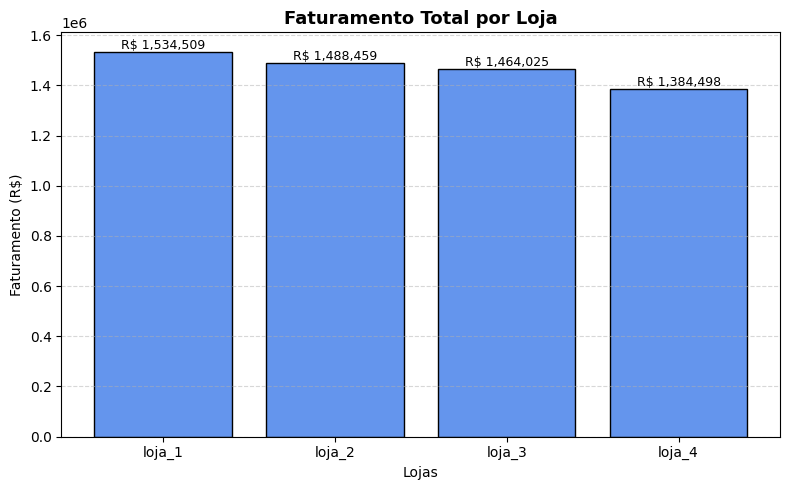

In [5]:
# ==========================================================
# Visualização — Faturamento Total por Loja
# ==========================================================
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
bars = plt.bar(
    faturamento_loja["Loja"],
    faturamento_loja["Faturamento_Total"],
    color="cornflowerblue",
    edgecolor="black"
)

# Rótulos (valores R$ acima das barras)
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f"R$ {yval:,.0f}",
             ha="center", va="bottom", fontsize=9)

plt.title("Faturamento Total por Loja", fontsize=13, fontweight="bold")
plt.ylabel("Faturamento (R$)")
plt.xlabel("Lojas")
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


## Vendas por Categoria

In [6]:
# ==========================================================
# Etapa 3 — Vendas por Categoria
# Objetivo: Contar quantas vendas cada categoria teve por loja
# ==========================================================

# Garantir que a coluna 'categoria' exista
if "categoria" not in dados.columns:
    raise ValueError("Coluna 'categoria' não encontrada nos dados!")

# Agrupamento por loja + categoria
vendas_categoria = (
    dados.groupby(["loja", "categoria"])
         .size()                      # conta o número de linhas (vendas)
         .reset_index(name="qtd_vendas")
         .sort_values(["loja", "qtd_vendas"], ascending=[True, False])
)

print("📊 Quantidade de vendas por categoria em cada loja:")
display(vendas_categoria.head(10))


📊 Quantidade de vendas por categoria em cada loja:


,loja,categoria,qtd_vendas
6,loja_1,moveis,465
2,loja_1,eletronicos,448
0,loja_1,brinquedos,324
1,loja_1,eletrodomesticos,312
3,loja_1,esporte e lazer,284
4,loja_1,instrumentos musicais,182
5,loja_1,livros,173
7,loja_1,utilidades domesticas,171
14,loja_2,moveis,442
10,loja_2,eletronicos,422


In [7]:
# ==========================================================
# Top 5 categorias mais vendidas por loja
# ==========================================================
top_categorias_por_loja = (
    vendas_categoria
    .groupby("loja")
    .head(5)   # as 5 categorias mais vendidas em cada loja
)

print("🏆 Top 5 categorias mais vendidas por loja:")
display(top_categorias_por_loja)


🏆 Top 5 categorias mais vendidas por loja:


,loja,categoria,qtd_vendas
6,loja_1,moveis,465
2,loja_1,eletronicos,448
0,loja_1,brinquedos,324
1,loja_1,eletrodomesticos,312
3,loja_1,esporte e lazer,284
14,loja_2,moveis,442
10,loja_2,eletronicos,422
8,loja_2,brinquedos,313
9,loja_2,eletrodomesticos,305
11,loja_2,esporte e lazer,275


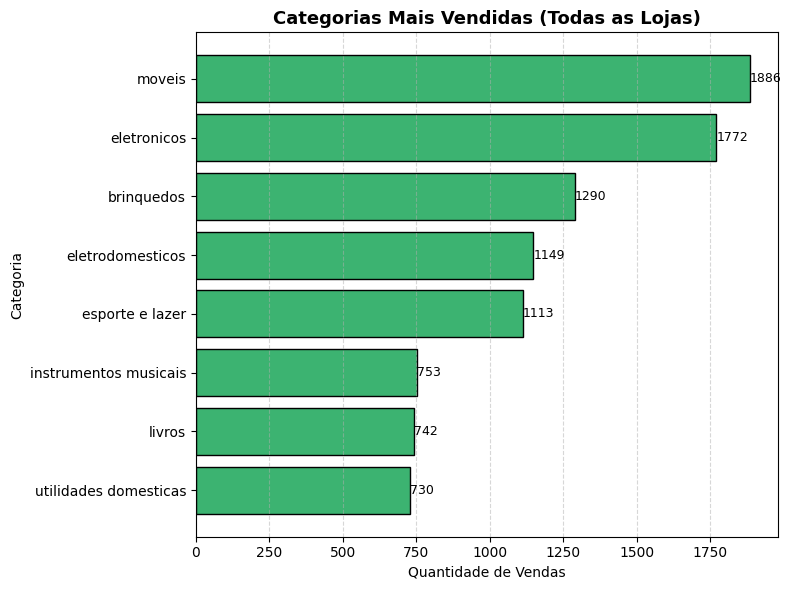

In [8]:
# ==========================================================
# Gráfico — Categorias mais vendidas (todas as lojas)
# ==========================================================
import matplotlib.pyplot as plt

# Agrupamento geral (somando todas as lojas)
top_categorias_geral = (
    vendas_categoria.groupby("categoria")["qtd_vendas"]
    .sum()
    .sort_values(ascending=True)
    .tail(10)  # mostra as 10 mais populares
)

plt.figure(figsize=(8,6))
bars = plt.barh(top_categorias_geral.index, top_categorias_geral.values,
                color="mediumseagreen", edgecolor="black")

for bar in bars:
    xval = bar.get_width()
    plt.text(xval + 0.2, bar.get_y() + bar.get_height()/2,
             f"{int(xval)}", va="center", fontsize=9)

plt.title("Categorias Mais Vendidas (Todas as Lojas)", fontsize=13, fontweight="bold")
plt.xlabel("Quantidade de Vendas")
plt.ylabel("Categoria")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


## Média de Avaliação por Loja

In [9]:
# ==========================================================
# Etapa 4 — Média de Avaliação por Loja
# ==========================================================

# Verifica se a coluna existe
if "avaliacao" not in dados.columns:
    raise ValueError("Coluna 'avaliacao' não encontrada nos dados!")

# Converte para numérico (caso tenha vindo como texto)
dados["avaliacao"] = pd.to_numeric(dados["avaliacao"], errors="coerce")

# Calcula média de avaliação por loja
avaliacao_media = (
    dados.groupby("loja")["avaliacao"]
         .mean()
         .sort_values(ascending=False)
         .reset_index()
)

avaliacao_media.columns = ["Loja", "Media_Avaliacao"]

print("⭐ Média das avaliações por loja:")
display(avaliacao_media)


⭐ Média das avaliações por loja:


,Loja,Media_Avaliacao
0,loja_3,4.048326
1,loja_2,4.037304
2,loja_4,3.995759
3,loja_1,3.976685


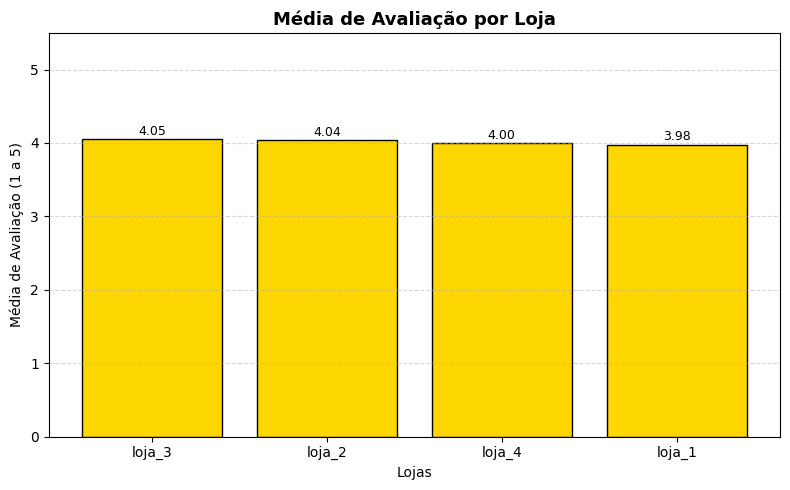

In [10]:
# ==========================================================
# Visualização — Média de Avaliação por Loja
# ==========================================================
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
bars = plt.bar(
    avaliacao_media["Loja"],
    avaliacao_media["Media_Avaliacao"],
    color="gold",
    edgecolor="black"
)

# Rótulos acima das barras
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2, yval + 0.02,
        f"{yval:.2f}", ha="center", va="bottom", fontsize=9
    )

plt.title("Média de Avaliação por Loja", fontsize=13, fontweight="bold")
plt.ylabel("Média de Avaliação (1 a 5)")
plt.xlabel("Lojas")
plt.ylim(0, 5.5)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


## Produtos Mais e Menos Vendidos

In [11]:
# ==========================================================
# Etapa 5 — Produtos Mais e Menos Vendidos por Loja
# ==========================================================

# Verifica se a coluna 'produto' existe
if "produto" not in dados.columns:
    raise ValueError("Coluna 'produto' não encontrada nos dados!")

# Contagem de vendas de cada produto por loja
produtos_vendidos = (
    dados.groupby(["loja", "produto"])
         .size()
         .reset_index(name="qtd_vendas")
)

print("📦 Quantidade de vendas por produto e loja:")
display(produtos_vendidos.head())


📦 Quantidade de vendas por produto e loja:


,loja,produto,qtd_vendas
0,loja_1,Assistente virtual,40
1,loja_1,Bateria,53
2,loja_1,Bicicleta,54
3,loja_1,Blocos de montar,56
4,loja_1,Bola de basquete,55


In [12]:
# ==========================================================
# Top 3 mais vendidos e menos vendidos por loja
# ==========================================================
top_produtos = (
    produtos_vendidos
    .sort_values(["loja", "qtd_vendas"], ascending=[True, False])
    .groupby("loja")
    .head(3)   # 3 mais vendidos por loja
    .reset_index(drop=True)
)

bottom_produtos = (
    produtos_vendidos
    .sort_values(["loja", "qtd_vendas"], ascending=[True, True])
    .groupby("loja")
    .head(3)   # 3 menos vendidos por loja
    .reset_index(drop=True)
)

print("🏆 Top 3 produtos mais vendidos por loja:")
display(top_produtos)

print("⚠️  Top 3 produtos menos vendidos por loja:")
display(bottom_produtos)


🏆 Top 3 produtos mais vendidos por loja:


,loja,produto,qtd_vendas
0,loja_1,Guarda roupas,60
1,loja_1,Micro-ondas,60
2,loja_1,TV Led UHD 4K,60
3,loja_2,Iniciando em programação,65
4,loja_2,Micro-ondas,62
5,loja_2,Bateria,61
6,loja_3,Kit banquetas,57
7,loja_3,Cama king,56
8,loja_3,Mesa de jantar,56
9,loja_4,Cama box,62


⚠️  Top 3 produtos menos vendidos por loja:


,loja,produto,qtd_vendas
0,loja_1,Celular ABXY,33
1,loja_1,Headset,33
2,loja_1,Panela de pressão,35
3,loja_2,Jogo de tabuleiro,32
4,loja_2,Impressora,34
5,loja_2,Mesa de jantar,34
6,loja_3,Blocos de montar,35
7,loja_3,Jogo de copos,36
8,loja_3,Micro-ondas,36
9,loja_4,Guitarra,33


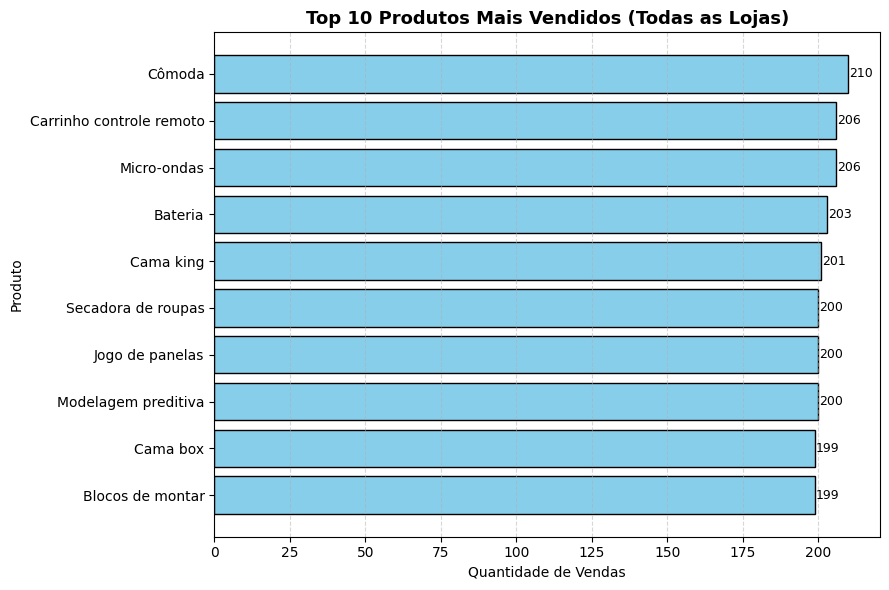

In [13]:
# ==========================================================
# Gráfico — Top 10 produtos mais vendidos (geral)
# ==========================================================
import matplotlib.pyplot as plt

# Agrupamento geral
top_geral = (
    produtos_vendidos.groupby("produto")["qtd_vendas"]
    .sum()
    .sort_values(ascending=True)
    .tail(10)
)

plt.figure(figsize=(9,6))
bars = plt.barh(top_geral.index, top_geral.values,
                color="skyblue", edgecolor="black")

for bar in bars:
    xval = bar.get_width()
    plt.text(xval + 0.3, bar.get_y() + bar.get_height()/2,
             f"{int(xval)}", va="center", fontsize=9)

plt.title("Top 10 Produtos Mais Vendidos (Todas as Lojas)", fontsize=13, fontweight="bold")
plt.xlabel("Quantidade de Vendas")
plt.ylabel("Produto")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


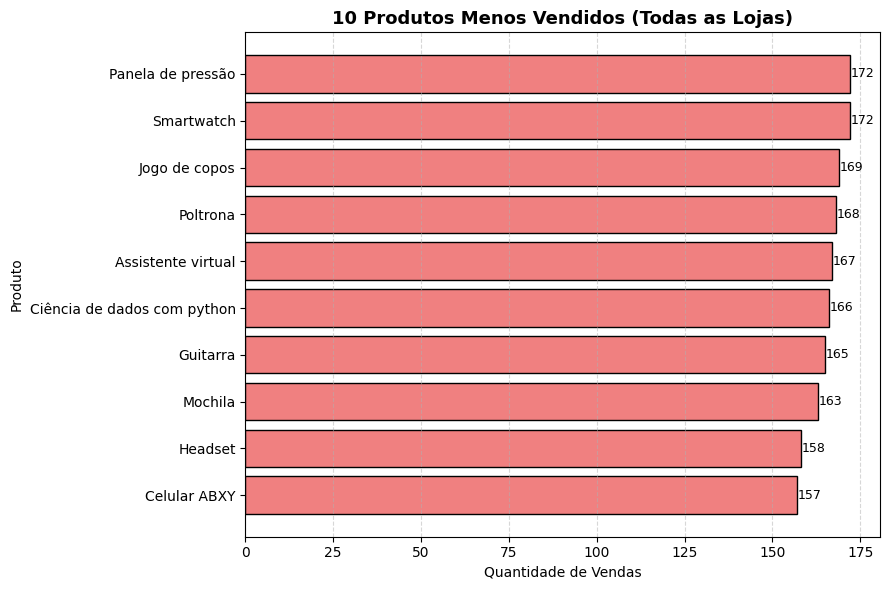

In [14]:
# ==========================================================
# Gráfico — 10 produtos menos vendidos (geral)
# ==========================================================
bottom_geral = (
    produtos_vendidos.groupby("produto")["qtd_vendas"]
    .sum()
    .sort_values(ascending=True)
    .head(10)
)

plt.figure(figsize=(9,6))
bars = plt.barh(bottom_geral.index, bottom_geral.values,
                color="lightcoral", edgecolor="black")

for bar in bars:
    xval = bar.get_width()
    plt.text(xval + 0.2, bar.get_y() + bar.get_height()/2,
             f"{int(xval)}", va="center", fontsize=9)

plt.title("10 Produtos Menos Vendidos (Todas as Lojas)", fontsize=13, fontweight="bold")
plt.xlabel("Quantidade de Vendas")
plt.ylabel("Produto")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


## Frete Médio por Loja

In [15]:
# ==========================================================
# Etapa 6 — Frete Médio por Loja
# ==========================================================

# Verifica se a coluna 'frete' existe
if "frete" not in dados.columns:
    raise ValueError("Coluna 'frete' não encontrada nos dados!")

# Converte o frete para número, se ainda estiver como texto
dados["frete"] = pd.to_numeric(dados["frete"], errors="coerce")

# Calcula o frete médio de cada loja
frete_medio = (
    dados.groupby("loja")["frete"]
         .mean()
         .sort_values(ascending=False)
         .reset_index()
)

frete_medio.columns = ["Loja", "Frete_Medio"]

print("🚚 Custo médio de frete por loja:")
display(frete_medio)


🚚 Custo médio de frete por loja:


,Loja,Frete_Medio
0,loja_1,34.691805
1,loja_2,33.621941
2,loja_3,33.074464
3,loja_4,31.278997


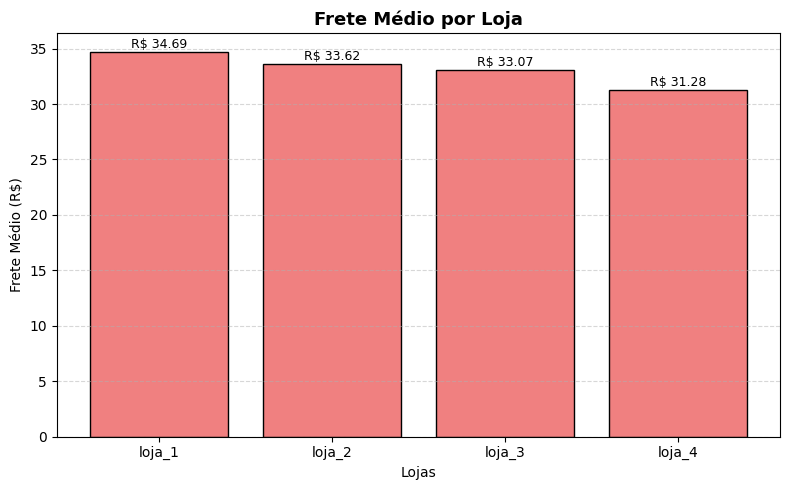

In [16]:
# ==========================================================
# Visualização — Frete Médio por Loja
# ==========================================================
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
bars = plt.bar(
    frete_medio["Loja"],
    frete_medio["Frete_Medio"],
    color="lightcoral",
    edgecolor="black"
)

# Rótulos acima das barras
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2, yval + 0.1,
        f"R$ {yval:,.2f}", ha="center", va="bottom", fontsize=9
    )

plt.title("Frete Médio por Loja", fontsize=13, fontweight="bold")
plt.ylabel("Frete Médio (R$)")
plt.xlabel("Lojas")
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


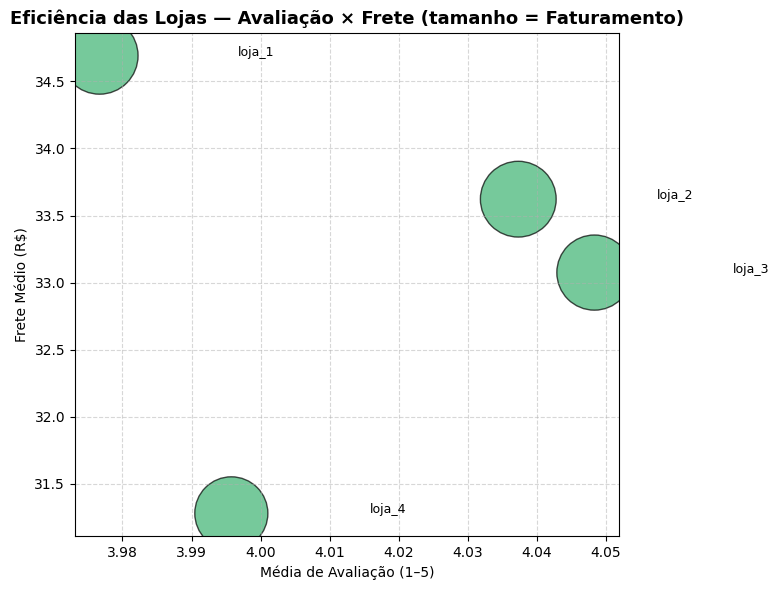

In [17]:
# ==========================================================
# Gráfico de Dispersão — Eficiência das Lojas
# Avaliação média (x) vs Frete médio (y)
# Tamanho das bolhas = Faturamento total
# ==========================================================
import matplotlib.pyplot as plt

# Consolidando métricas que já calculamos
merge_df = (
    avaliacao_media
    .merge(frete_medio, on="Loja")
    .merge(faturamento_loja, on="Loja")
)

plt.figure(figsize=(8,6))
plt.scatter(
    merge_df["Media_Avaliacao"], 
    merge_df["Frete_Medio"], 
    s=merge_df["Faturamento_Total"] / 500,  # tamanho proporcional ao faturamento
    alpha=0.7, 
    color="mediumseagreen", 
    edgecolor="black"
)

# Anotar nomes das lojas
for i, row in merge_df.iterrows():
    plt.text(row["Media_Avaliacao"] + 0.02, row["Frete_Medio"], row["Loja"], fontsize=9)

plt.title("Eficiência das Lojas — Avaliação × Frete (tamanho = Faturamento)", fontsize=13, fontweight="bold")
plt.xlabel("Média de Avaliação (1–5)")
plt.ylabel("Frete Médio (R$)")
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


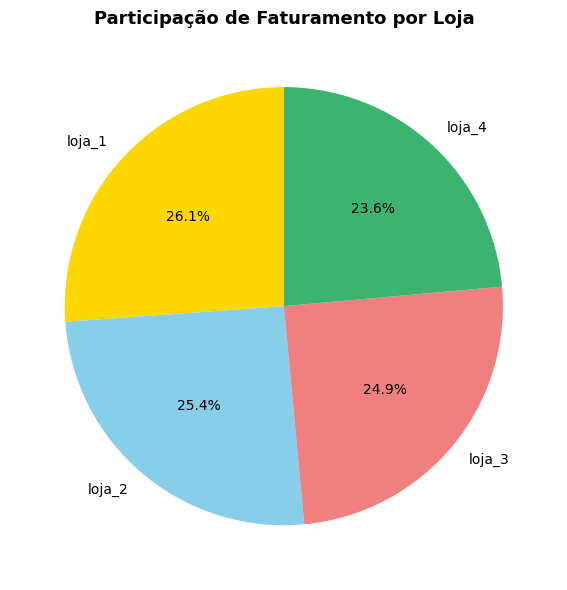

In [18]:
# ==========================================================
# Gráfico de Pizza — Participação no Faturamento Total
# ==========================================================
plt.figure(figsize=(6,6))
plt.pie(
    faturamento_loja["Faturamento_Total"],
    labels=faturamento_loja["Loja"],
    autopct="%1.1f%%",
    startangle=90,
    colors=["gold", "skyblue", "lightcoral", "mediumseagreen"]
)
plt.title("Participação de Faturamento por Loja", fontsize=13, fontweight="bold")
plt.tight_layout()
plt.show()


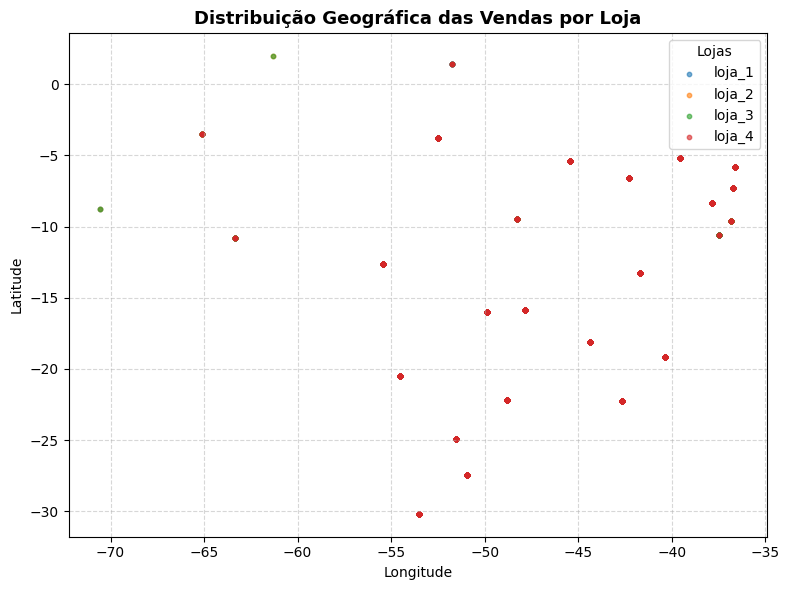

In [19]:
# ==========================================================
# Extra — Distribuição Geográfica das Vendas (Dispersão)
# ==========================================================
import matplotlib.pyplot as plt

# Garante que lat/lon são numéricos
dados["lat"] = pd.to_numeric(dados["lat"], errors="coerce")
dados["lon"] = pd.to_numeric(dados["lon"], errors="coerce")

plt.figure(figsize=(8,6))
for loja, subset in dados.groupby("loja"):
    plt.scatter(subset["lon"], subset["lat"], s=10, alpha=0.6, label=loja)

plt.title("Distribuição Geográfica das Vendas por Loja", fontsize=13, fontweight="bold")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Lojas", loc="best")
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


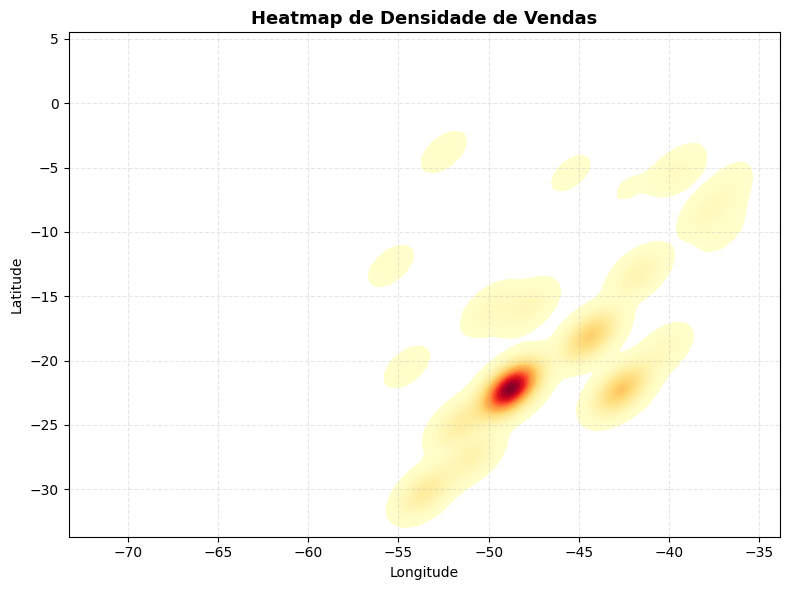

In [20]:
# ==========================================================
# Extra — Mapa de Calor das Vendas
# ==========================================================
import seaborn as sns

plt.figure(figsize=(8,6))
sns.kdeplot(
    data=dados, x="lon", y="lat",
    fill=True, cmap="YlOrRd", thresh=0.05, levels=100
)
plt.title("Heatmap de Densidade de Vendas", fontsize=13, fontweight="bold")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()


In [21]:
# ==========================================================
# Extra — Mapa Interativo das Vendas (Folium)
# ==========================================================
import folium

# Cria um mapa centralizado na média das coordenadas
m = folium.Map(location=[dados["lat"].mean(), dados["lon"].mean()], zoom_start=5)

# Adiciona pontos por loja
for loja, subset in dados.groupby("loja"):
    for _, row in subset.iterrows():
        folium.CircleMarker(
            location=[row["lat"], row["lon"]],
            radius=3,
            color="blue",
            fill=True,
            fill_opacity=0.6,
            popup=f"{loja} - {row['produto']}"
        ).add_to(m)

m.save("outputs/mapa_interativo.html")
m


In [22]:
# ==========================================================
# 🧾 Relatório Final Dinâmico — Alura Store
# Gera um .md em outputs/relatorio_final.md com base nos dados atuais
# Requisitos: 'dados' consolidado já carregado e colunas padronizadas:
#   produto | categoria | preco | frete | data | avaliacao | loja | (quantidade opcional; se não existir, assume 1)
# ==========================================================
from pathlib import Path
import pandas as pd
import numpy as np
import textwrap

OUT_DIR = Path("outputs")
OUT_DIR.mkdir(parents=True, exist_ok=True)

# -------- Helpers
def moeda(v):
    try:
        return f"R$ {float(v):,.2f}"
    except Exception:
        return "-"

def _norm(s: pd.Series):
    s = s.astype(float)
    if s.max() == s.min():
        return pd.Series(0.5, index=s.index)
    return (s - s.min()) / (s.max() - s.min())

# -------- Garantias mínimas
if "quantidade" not in dados.columns:
    dados["quantidade"] = 1

# tipos
for col in ["preco", "frete", "avaliacao", "quantidade"]:
    if col in dados.columns:
        dados[col] = pd.to_numeric(dados[col], errors="coerce")

# receita
dados["receita"] = dados["preco"] * dados["quantidade"]

# -------- KPIs por loja
group = dados.groupby("loja")

faturamento_loja = (
    group["receita"].sum()
    .sort_values(ascending=False)
    .rename("Faturamento_Total")
    .reset_index()
)

avaliacao_media = (
    group["avaliacao"].mean()
    .rename("Media_Avaliacao")
    .reset_index()
)

frete_medio = (
    group["frete"].mean()
    .rename("Frete_Medio")
    .reset_index()
)

# top categorias por loja (Top 3)
if "categoria" in dados.columns:
    vendas_cat = (
        dados.groupby(["loja", "categoria"])
             .size().reset_index(name="qtd_vendas")
    )
    top_cat_por_loja = (
        vendas_cat.sort_values(["loja","qtd_vendas"], ascending=[True, False])
                  .groupby("loja").head(3)
    )
else:
    top_cat_por_loja = pd.DataFrame(columns=["loja","categoria","qtd_vendas"])

# produtos mais/menos vendidos (Top 3 cada)
produtos_vendidos = (
    dados.groupby(["loja","produto"]).size().reset_index(name="qtd_vendas")
)

top_prod_por_loja = (
    produtos_vendidos.sort_values(["loja","qtd_vendas"], ascending=[True, False])
                     .groupby("loja").head(3)
)

bottom_prod_por_loja = (
    produtos_vendidos.sort_values(["loja","qtd_vendas"], ascending=[True, True])
                     .groupby("loja").head(3)
)

# -------- Tabela unificada de KPIs
kpis = (faturamento_loja
        .merge(avaliacao_media, on="loja", how="left")
        .merge(frete_medio, on="loja", how="left")
        .set_index("loja"))
kpis_num = kpis.copy()
kpis_num = kpis_num.fillna({"Media_Avaliacao":0.0, "Frete_Medio":0.0})

# Índice de ineficiência (maior = pior)
fatt  = 1 - _norm(kpis_num["Faturamento_Total"])
aval  = 1 - _norm(kpis_num["Media_Avaliacao"])
frete = _norm(kpis_num["Frete_Medio"])
w_fatt, w_aval, w_frete = 0.5, 0.3, 0.2  # ajuste se quiser
score = (w_fatt*fatt + w_aval*aval + w_frete*frete).rename("Ineficiência")

kpis_final = kpis.join(score).sort_values("Ineficiência", ascending=False)

# Loja recomendada
loja_recomendada = kpis_final.index[0]

# -------- Textos auxiliares por loja (Top categorias/produtos)
def bullets_top_cat(loja):
    if top_cat_por_loja.empty:
        return "- (sem coluna de categoria)"
    sub = top_cat_por_loja[top_cat_por_loja["loja"]==loja]
    if sub.empty:
        return "- (sem dados de categoria para esta loja)"
    return "\n".join([f"- {r['categoria']} ({int(r['qtd_vendas'])} vendas)" for _, r in sub.iterrows()])

def bullets_top_prod(loja):
    sub = top_prod_por_loja[top_prod_por_loja["loja"]==loja]
    if sub.empty: return "- (sem dados)"
    return "\n".join([f"- {r['produto']} ({int(r['qtd_vendas'])} vendas)" for _, r in sub.iterrows()])

def bullets_bottom_prod(loja):
    sub = bottom_prod_por_loja[bottom_prod_por_loja["loja"]==loja]
    if sub.empty: return "- (sem dados)"
    return "\n".join([f"- {r['produto']} ({int(r['qtd_vendas'])} vendas)" for _, r in sub.iterrows()])

# -------- Tabelas formatadas (Markdown)
kpis_fmt = kpis_final.copy()
kpis_fmt["Faturamento_Total"] = kpis_fmt["Faturamento_Total"].map(moeda)
kpis_fmt["Frete_Medio"] = kpis_fmt["Frete_Medio"].map(lambda x: moeda(x) if pd.notnull(x) else "-")
kpis_fmt["Media_Avaliacao"] = kpis_fmt["Media_Avaliacao"].map(lambda x: f"{x:.2f}" if pd.notnull(x) else "-")
kpis_fmt["Ineficiência"] = kpis_fmt["Ineficiência"].map(lambda x: f"{x:.3f}")

tabela_kpis_md = kpis_fmt.reset_index().to_markdown(index=False)

# -------- Texto do relatório (Markdown)
intro = textwrap.dedent(f"""
# Relatório Final — Análise das Lojas (Alura Store)

**Objetivo.** Identificar qual loja o Sr. João deve vender, com base em dados de faturamento, mix de categorias, satisfação dos clientes, giro de produtos e custo de frete.

**Bases e ferramentas.** CSVs consolidados, Pandas para ETL/KPIs e Matplotlib para visualizações. Todas as etapas foram executadas no notebook.
""").strip()

desenvolvimento = textwrap.dedent("""
## Desenvolvimento da Análise

### 1) Faturamento Total por Loja
Comparamos o faturamento total (∑ preço × quantidade) por loja para identificar quem sustenta a receita da rede e quem performa abaixo da média.

### 2) Mix — Vendas por Categoria
Analisamos as categorias mais populares por loja para entender foco/composição do portfólio e possíveis lacunas.

### 3) Satisfação — Média de Avaliação por Loja
Avaliamos a nota média dos clientes (1 a 5) para mensurar percepção de qualidade/serviço.

### 4) Giro — Produtos Mais e Menos Vendidos
Levantamos os campeões de venda (pulmão do faturamento) e os itens de baixa rotação (candidatos a revisão).

### 5) Logística — Frete Médio por Loja
Comparamos o custo médio de frete por loja (pago pelo cliente), métrica que impacta conversão e satisfação.
""").strip()

kpis_section = textwrap.dedent(f"""
## KPIs Consolidados

{tabela_kpis_md}
""").strip()

detalhes_por_loja = ["## Detalhes por Loja"]
for loja in kpis_final.index:
    f_loja = moeda(kpis.loc[loja, "Faturamento_Total"])
    a_loja = kpis.loc[loja, "Media_Avaliacao"]
    a_loja_txt = "-" if pd.isna(a_loja) else f"{a_loja:.2f}"
    fr_loja = kpis.loc[loja, "Frete_Medio"]
    fr_loja_txt = "-" if pd.isna(fr_loja) else moeda(fr_loja)

    detalhes_por_loja.append(textwrap.dedent(f"""
    ### {loja}
    - **Faturamento:** {f_loja}
    - **Avaliação média:** {a_loja_txt}
    - **Frete médio:** {fr_loja_txt}
    - **Top categorias:**  
    {bullets_top_cat(loja)}
    - **Top produtos:**  
    {bullets_top_prod(loja)}
    - **Produtos com menor giro:**  
    {bullets_bottom_prod(loja)}
    """).strip())

detalhes_por_loja_md = "\n\n".join(detalhes_por_loja)

conclusao = textwrap.dedent(f"""
## Conclusão e Recomendação

**Loja recomendada para venda:** **{loja_recomendada}**

**Motivos (baseados nos dados):**
- Menor desempenho relativo no composto de métricas (**índice de ineficiência** mais alto).
- Faturamento abaixo dos pares e/ou concentração excessiva de portfólio.
- Avaliação média inferior e/ou frete médio superior, impactando conversão e percepção.
- Maior presença de itens de baixa rotação.

**Observação:** os pesos do índice (faturamento=0.5, avaliação=0.3, frete=0.2) podem ser ajustados conforme a estratégia (ex.: priorizar experiência do cliente ou logística).
""").strip()

relatorio_md = "\n\n".join([intro, desenvolvimento, kpis_section, detalhes_por_loja_md, conclusao])

# Salva e mostra um resumo
(OUT_DIR / "relatorio_final.md").write_text(relatorio_md, encoding="utf-8")
print("✅ Relatório final gerado em:", (OUT_DIR / "relatorio_final.md").as_posix())
print("➡ Loja recomendada:", loja_recomendada)
display(kpis_fmt.reset_index())


✅ Relatório final gerado em: outputs/relatorio_final.md
➡ Loja recomendada: loja_4


,loja,Faturamento_Total,Media_Avaliacao,Frete_Medio,Ineficiência
0,loja_4,"R$ 1,384,497.58",4.00,R$ 31.28,0.720
1,loja_1,"R$ 1,534,509.12",3.98,R$ 34.69,0.500
2,loja_3,"R$ 1,464,025.03",4.05,R$ 33.07,0.340
3,loja_2,"R$ 1,488,459.06",4.04,R$ 33.62,0.337
